# 0. Imports and Load Data

In [2]:
import os
import glob
import random
import json
from pathlib import Path
import pandas as pd
import yaml
import cv2
import matplotlib.pyplot as plt
from collections import Counter
from ultralytics import YOLO
import warnings


warnings.filterwarnings('ignore')

In [4]:
DATA_YAML_PATH = "../data/data.yaml"
ruta_base = Path(DATA_YAML_PATH).parent

assert os.path.exists(DATA_YAML_PATH), f"data.yaml not found in {DATA_YAML_PATH}"

with open(DATA_YAML_PATH, "r") as f:
    data_cfg = yaml.safe_load(f)

data_cfg['train'] = str((ruta_base / data_cfg['train']).resolve())
data_cfg['val'] = str((ruta_base / data_cfg['val']).resolve())
data_cfg['test'] = str((ruta_base / data_cfg['test']).resolve())
data_cfg

{'train': 'D:\\Proyectos\\LATAM Airlines\\challenge\\data\\train\\images',
 'val': 'D:\\Proyectos\\LATAM Airlines\\challenge\\data\\valid\\images',
 'test': 'D:\\Proyectos\\LATAM Airlines\\challenge\\data\\test\\images',
 'nc': 17,
 'names': ['car',
  'cardboard box',
  'forklift',
  'freight container',
  'gloves',
  'helmet',
  'ladder',
  'license plate',
  'person',
  'qr code',
  'road sign',
  'safety vest',
  'traffic cone',
  'traffic light',
  'truck',
  'van',
  'wood pallet'],
 'roboflow': {'workspace': 'srafil-ar',
  'project': 'forklift-6ms6v',
  'version': 1,
  'license': 'CC BY 4.0',
  'url': 'https://universe.roboflow.com/srafil-ar/forklift-6ms6v/dataset/1'}}

In [5]:
train_dir = data_cfg.get("train")
val_dir   = data_cfg.get("val")
test_dir  = data_cfg.get("test", None)
class_names = data_cfg.get("names", [])
nc = int(data_cfg.get("nc", len(class_names)))

print("Train images dir:", train_dir)
print("Val images dir  :", val_dir)
print("Test images dir :", test_dir)
print("Classes (nc)     :", nc)
print("Classes name:", class_names)

Train images dir: D:\Proyectos\LATAM Airlines\challenge\data\train\images
Val images dir  : D:\Proyectos\LATAM Airlines\challenge\data\valid\images
Test images dir : D:\Proyectos\LATAM Airlines\challenge\data\test\images
Classes (nc)     : 17
Classes name: ['car', 'cardboard box', 'forklift', 'freight container', 'gloves', 'helmet', 'ladder', 'license plate', 'person', 'qr code', 'road sign', 'safety vest', 'traffic cone', 'traffic light', 'truck', 'van', 'wood pallet']


# 1. Data Analysis: First Sight

In [5]:
def yolo_label_paths(img_dir: str) -> list:
    img_paths = []
    for ext in ("*.jpg", "*.jpeg", "*.png", "*.bmp"):
        img_paths.extend(glob.glob(os.path.join(img_dir, ext)))
    label_paths = []
    for ip in img_paths:
        lp = ip.replace(os.sep + "images" + os.sep, os.sep + "labels" + os.sep)
        lp = os.path.splitext(lp)[0] + ".txt"
        label_paths.append((ip, lp))
    return label_paths

def read_yolo_labels(label_path: str):
    if not os.path.exists(label_path):
        return []
    rows = []
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls_id = int(float(parts[0]))
                cx, cy, w, h = map(float, parts[1:5])
                rows.append((cls_id, cx, cy, w, h))
    return rows


In [5]:
def analyze_split(img_dir: str, class_names: list):
    pairs = yolo_label_paths(img_dir)
    per_class = Counter()
    objs_per_image = []
    areas = []

    for _, lbl_path in pairs:
        labels = read_yolo_labels(lbl_path)
        objs_per_image.append(len(labels))
        for (cls_id, cx, cy, w, h) in labels:
            per_class[cls_id] += 1
            areas.append(w * h)

    df_classes = pd.DataFrame({
        "class_id": list(per_class.keys()),
        "count": list(per_class.values())
    })
    df_classes["class_name"] = df_classes["class_id"].apply(lambda i: class_names[i] if i < len(class_names) else str(i))

    df_objs = pd.DataFrame({"objects_per_image": objs_per_image})
    df_areas = pd.DataFrame({"bbox_area_norm": areas})

    return df_classes.sort_values("count", ascending=False), df_objs, df_areas

df_classes_train, df_objs_train, df_areas_train = analyze_split(train_dir, class_names)
df_classes_train.head(), df_objs_train.describe(), df_areas_train.describe()

(    class_id  count         class_name
 3          2  24213           forklift
 2          8  20480             person
 0          1   1266      cardboard box
 13        12   1023       traffic cone
 1          3    447  freight container,
        objects_per_image
 count       20546.000000
 mean            2.405237
 std             2.472610
 min             1.000000
 25%             1.000000
 50%             2.000000
 75%             3.000000
 max            47.000000,
        bbox_area_norm
 count    49418.000000
 mean         0.155603
 std          0.224430
 min          0.000010
 25%          0.010547
 50%          0.045352
 75%          0.203203
 max          1.000000)

### How is the data distributed?
At first glance, the dataset is heavily skewed. **'Forklift'** and **'Person'** classes account for **94.2%** of all annotations. The minority classes combined make up less than **6%**. Without intervention like data augmentation (Mosaic), oversampling, or weighted loss, the model will likely exhibit high bias against these minority classes.

There is a significant gap between the distribution of mean bounding box area (**15.5%**) and the median (**4.5%**). This positive skew indicates that while there are a few large objects, the majority of targets are small relative to the image frame. With this in mind using high resolutions (>=640) or an architecture optimized for small objects will be critical.

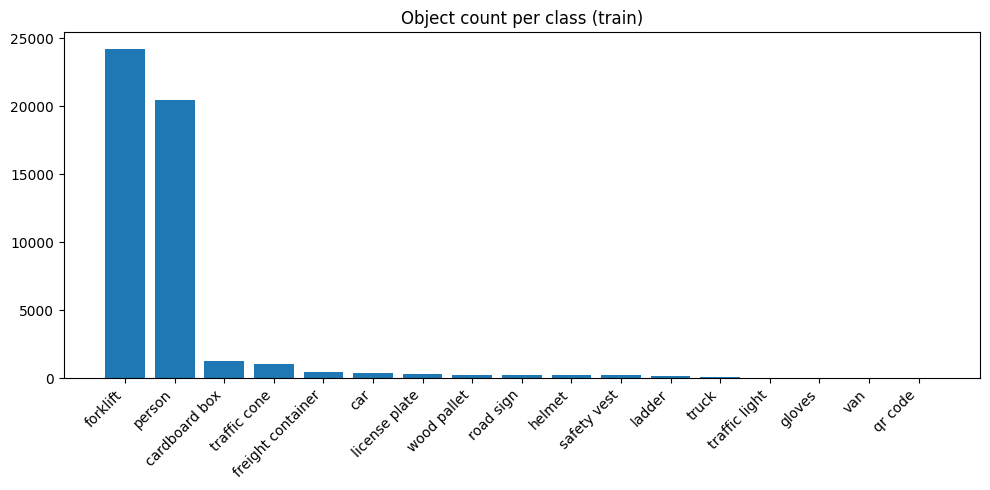

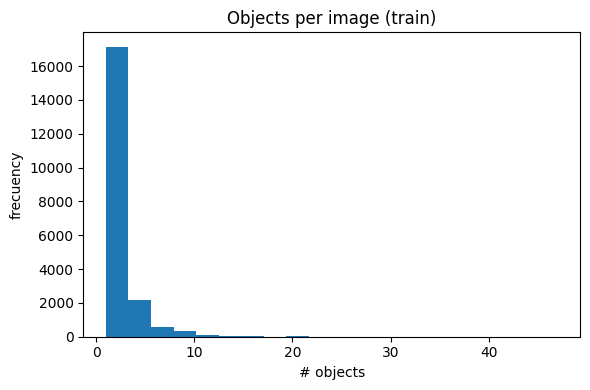

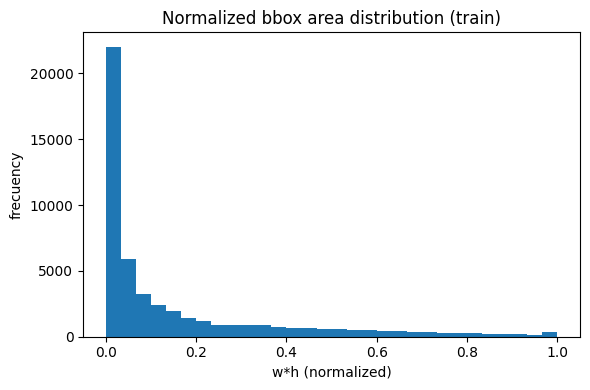

In [15]:
plt.figure(figsize=(10,5))
plt.bar(df_classes_train["class_name"], df_classes_train["count"])
plt.xticks(rotation=45, ha='right')
plt.title("Object count per class (train)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df_objs_train["objects_per_image"], bins=20)
plt.title("Objects per image (train)")
plt.xlabel("# objects")
plt.ylabel("frecuency")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df_areas_train["bbox_area_norm"], bins=30)
plt.title("Normalized bbox area distribution (train)")
plt.xlabel("w*h (normalized)")
plt.ylabel("frecuency")
plt.tight_layout()
plt.show()

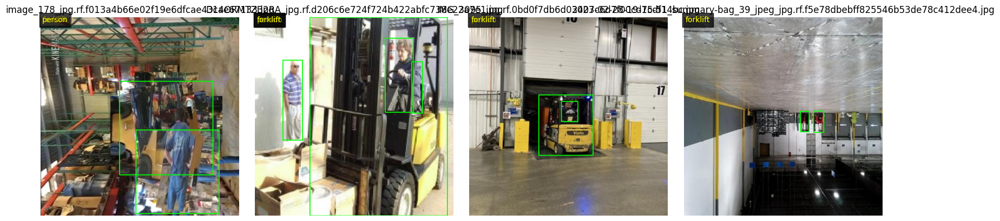

In [16]:
def draw_yolo_bbox(img, bbox, color=(0,255,0), thickness=2):
    H, W = img.shape[:2]
    cx, cy, bw, bh = bbox
    x1 = int((cx - bw/2) * W)
    y1 = int((cy - bh/2) * H)
    x2 = int((cx + bw/2) * W)
    y2 = int((cy + bh/2) * H)
    cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)
    return img

def visualize_samples(img_dir: str, class_names: list, n=4, seed=42):
    rng = random.Random(seed)
    pairs = yolo_label_paths(img_dir)
    sample = rng.sample(pairs, min(n, len(pairs)))
    fig, axes = plt.subplots(1, len(sample), figsize=(4*len(sample), 4))
    if len(sample) == 1:
        axes = [axes]
    for ax, (img_path, lbl_path) in zip(axes, sample):
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        labels = read_yolo_labels(lbl_path)
        for (cls_id, cx, cy, w, h) in labels:
            img = draw_yolo_bbox(img, (cx, cy, w, h))
            name = class_names[cls_id] if cls_id < len(class_names) else str(cls_id)
            ax.text(5, 15, name, color='yellow', bbox=dict(facecolor='black', alpha=0.5))
        ax.imshow(img)
        ax.set_title(Path(img_path).name)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

visualize_samples(train_dir, class_names, n=4, seed=7)

# Check for flawed labels with Mosaic visualization

Generating mosaic for: helmet
Scanning 20546 files for class 'helmet'...


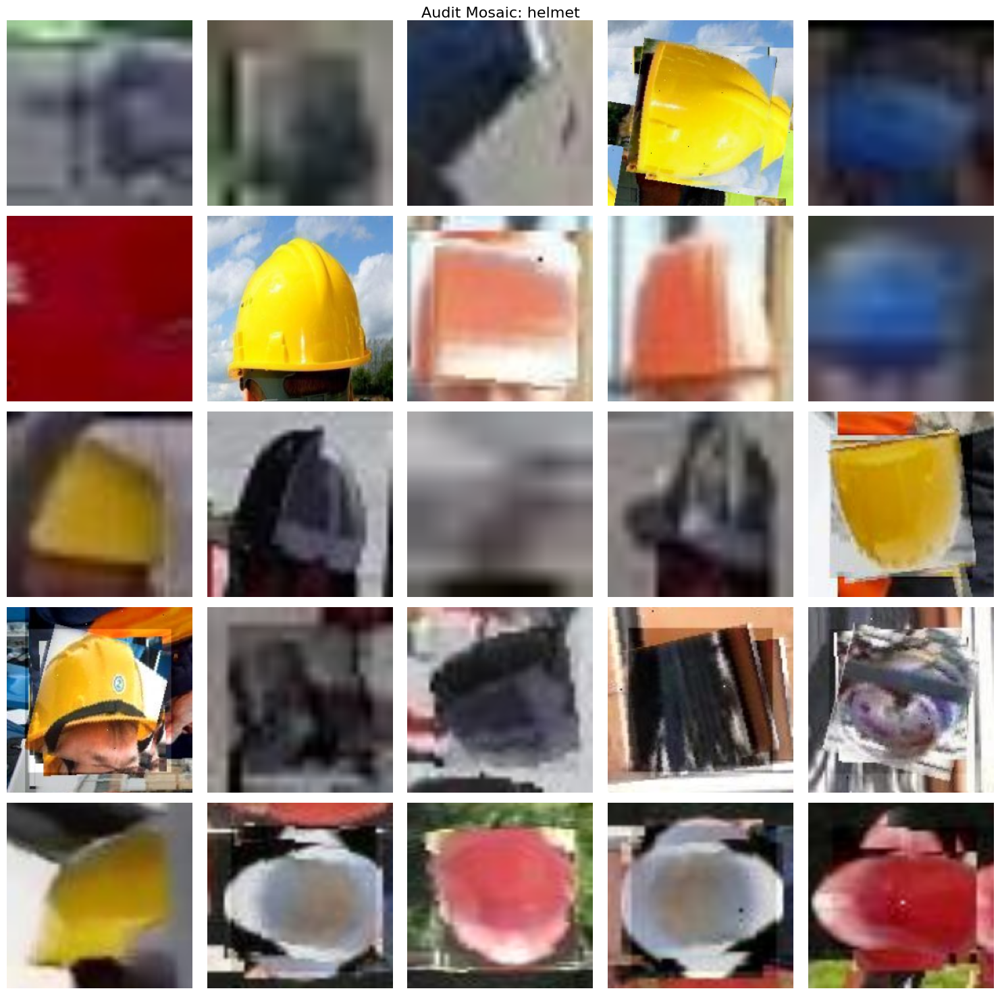

Generating mosaic for: safety vest
Scanning 20546 files for class 'safety vest'...


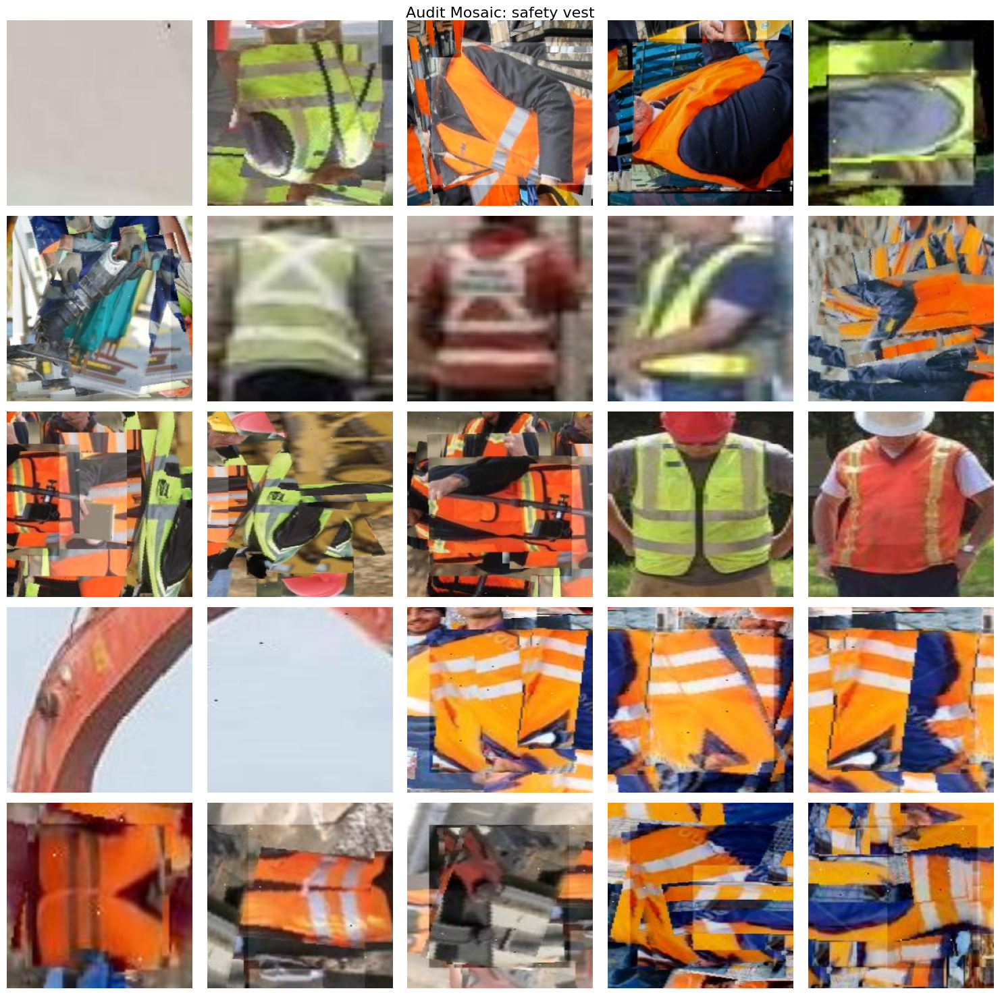

Generating mosaic for: traffic cone
Scanning 20546 files for class 'traffic cone'...


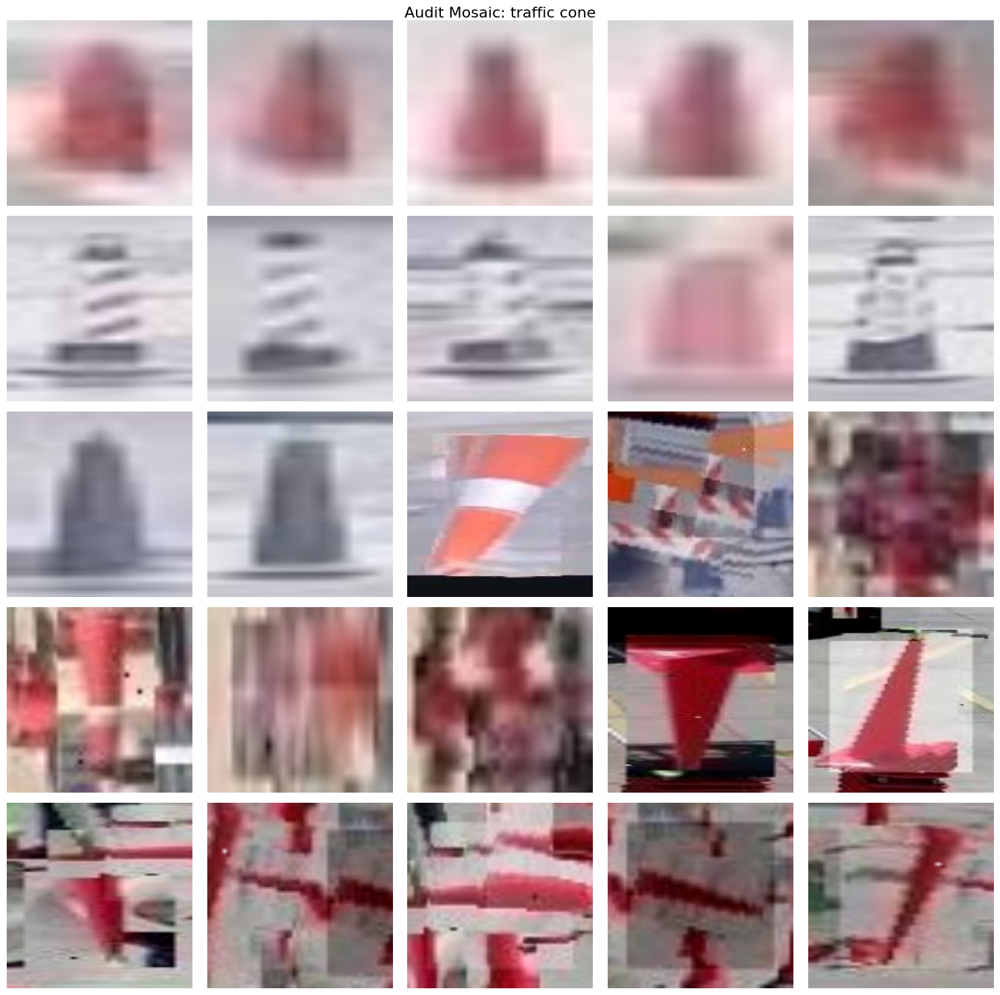

In [21]:
IMAGES_DIR = data_cfg['train']
LABELS_DIR = data_cfg['train'] + "/../labels"

# Grid settings
GRID_SIZE = (5, 5)  # 5x5 grid (25 images per batch)
PADDING = 0.15  # Add 15% context around the box
# =================================================

def denormalize_bbox(coords, img_w, img_h):
    """Converts YOLO normalized (x_c, y_c, w, h) to pixel (x1, y1, x2, y2)."""
    x_c, y_c, w, h = coords
    
    x_c *= img_w
    y_c *= img_h
    w *= img_w
    h *= img_h
    
    x1 = int(x_c - (w / 2))
    y1 = int(y_c - (h / 2))
    x2 = int(x_c + (w / 2))
    y2 = int(y_c + (h / 2))
    
    return x1, y1, x2, y2

def get_crops(target_class, num_samples=25):
    crops = []
    label_files = glob.glob(os.path.join(LABELS_DIR, "*.txt"))
    
    # Shuffle to get a random sample, or remove to check sequentially
    random.shuffle(label_files)

    print(f"Scanning {len(label_files)} files for class '{class_names[target_class]}'...")

    for lbl_path in label_files:
        if len(crops) >= num_samples:
            break

        try:
            with open(lbl_path, 'r') as f:
                lines = f.readlines()

            # Check if file contains target class
            target_lines = [line for line in lines if int(line.split()[0]) == target_class]
            
            if not target_lines:
                continue

            # Load image if we found a target
            # Assumes image has same basename as label and is jpg or png
            base_name = os.path.splitext(os.path.basename(lbl_path))[0]
            img_path = os.path.join(IMAGES_DIR, base_name + ".jpg")
            
            # Simple fallback for png if jpg doesn't exist
            if not os.path.exists(img_path):
                img_path = os.path.join(IMAGES_DIR, base_name + ".png")
            
            if not os.path.exists(img_path):
                continue

            img = cv2.imread(img_path)
            if img is None: continue
            
            img_h, img_w = img.shape[:2]
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            for line in target_lines:
                parts = list(map(float, line.strip().split()))
                
                # Get Coordinates
                x1, y1, x2, y2 = denormalize_bbox(parts[1:], img_w, img_h)
                
                # Add Padding
                box_w, box_h = x2 - x1, y2 - y1
                pad_x = int(box_w * PADDING)
                pad_y = int(box_h * PADDING)
                
                x1 = max(0, x1 - pad_x)
                y1 = max(0, y1 - pad_y)
                x2 = min(img_w, x2 + pad_x)
                y2 = min(img_h, y2 + pad_y)
                
                # Crop
                crop = img[y1:y2, x1:x2]
                
                # Add to list if crop is valid
                if crop.size > 0:
                    crops.append(crop)
                    if len(crops) >= num_samples: 
                        break
                        
        except Exception as e:
            print(f"Error processing {lbl_path}: {e}")
            continue

    return crops

def plot_mosaic(crops, target_class):
    if not crops:
        print("No samples found for this class.")
        return

    rows, cols = GRID_SIZE
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    fig.suptitle(f"Audit Mosaic: {class_names[target_class]}", fontsize=16)
    
    # Flatten axes array for easy iteration
    axes_flat = axes.flatten()

    for i, ax in enumerate(axes_flat):
        ax.axis('off')
        if i < len(crops):
            # Resize for uniform display in grid
            display_crop = cv2.resize(crops[i], (224, 224))
            ax.imshow(display_crop)
        else:
            # Hide unused subplots
            ax.set_visible(False)

    plt.tight_layout()
    plt.show()


# Classes to audit
TARGET_CLASS_IDS = [5, 11, 12] # Look for helmets, safety_vests and traffic_cones as they are underrepresented and easily recognizable
for TARGET_CLASS_ID in TARGET_CLASS_IDS:
    print(f"Generating mosaic for: {class_names[TARGET_CLASS_ID]}")
    found_crops = get_crops(TARGET_CLASS_ID, num_samples=GRID_SIZE[0]*GRID_SIZE[1])
    plot_mosaic(found_crops, TARGET_CLASS_ID)

### What methods would you use to verify the reliability of the labels?
In order to verify the reliability of the labels, we can use the following methods:
- **Class-Specific Mosaics** (in the previous script): Since manually reviewing 20000 images is impossible or would need a whole team of annotators.
- **Statistical & Geometric Heuristics**: Apply techniques such as:
  - Aspect Ratio Filtering: a standing person typically has a height > width. If a label says "Person" but the bounding box is 3x wider than it is tall, it's likely a mistake.
  - Low pixel noise: very small boxes (~1 px) are likely to be misclicks or artifacts.
- **Model-Assisted Validation**: train a "weak" baseline model for a low number of epochs and use it to audit the data with the following strategies:
  - Loss Ranking: Identify samples with the highest loss as potential mislabels.
  - Ghost Label Detection: Identify labels that consistently receive low confidence scores from the model.
  
With these methods, we can be able to identify and correct potential labeling errors, thereby improving the overall quality of the dataset.

# 2. Training

In [6]:
# ==============================
# 🔧 HYPERPARAMETERS — EXPERIMENTAL SETUP
# ==============================

# TODO: Fill in the hyperparameters based on your dataset analysis.
# Justify your choices in the Markdown cell above.
import torch

EPOCHS = 30 # Moderate epochs to allow learning without overfitting and check if the model is learning
IMGSZ  = 640 # Moderate image size to capture small objects better and fit GPU memory
BATCH  = 16 # Minimum recommended for stable training.
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Select GPU if available

PATIENCE = 5  # Early stopping patience
MIXUP = 0.1 # Regularization for class imbalance

# Try YOLO11; if not available use YOLOv8
weights_try = ["runs/detect/train11/weights/best.pt","yolo11n.pt","yolov8n.pt"]
model = None
for w in weights_try:
    try:
        model = YOLO(w)
        print("Using:", w)
        break
    except Exception as e:
        print(f"Failed to load {w}: {e}")

assert model is not None, "Could not load a base model (yolo11n.pt / yolov8n.pt). Install ultralytics and make sure you have an active internet connection to download the weights."


# ==============================
# 🚀 TRAINING — BASELINE EXPERIMENT
# ==============================
# The results object contains metrics, charts, and run directory info.
# Feel free to adjust and rerun with different hyperparameters.

# results = model.train(data=DATA_YAML_PATH, epochs=EPOCHS, imgsz=IMGSZ, batch=BATCH, device=DEVICE, patience=PATIENCE, mixup=MIXUP)
# results

Using: runs/detect/train11/weights/best.pt


### ✏️ Discussion

Explain:
1. Why did you choose these hyperparameters?
   - I chose these hyperparameters based on a combination of prior experience, current hardware limitations, and analysis of the dataset characteristics. Following is the explanation of each hyperparameter choice:
     - **Epochs**: The number of epochs was selected to provide sufficient training iterations in order to check if the model is able to learn the underlying patterns in the data. This allows enough time for the Mosaic Augmentation to be effective and for the learning rate to converge.
     - **Batch Size**: A batch size of 16 was prioritized to ensure batch normalization stability during training, which is particularly important given the dataset complexity and class imbalance.
     - **Image Size**: As the EDA showed a prevalence of small objects, an image size of 640 was chosen to balance the need for detail with the constraints of GPU memory to prevent OOM errors.
     - **Mixup**: A mixup value of 0.1 was selected to introduce regularization during training, which can help mitigate overfitting and improve generalization, especially in the presence of class imbalance of the given dataset, preventing the model from being "overconfident" on 'Forklifts' and 'Person' classes.
  
2. How do they affect training time, GPU/CPU usage, and accuracy?
   The batch size and image size directly impact GPU memory usage. A larger batch size increases memory consumption but can lead to more stable gradient estimates, while a larger image size improves the model's ability to have bette accuracy at detecting small objects but also increases computational load (possible OOM) and training time. The trade-off was made to balance these factors within the constraints of the available hardware and time limitations of the challenge.

3. What would you try differently if you had more time or resources?
   If more time and resources were available, I would consider the following adjustments:
    - **Model Selection**: We should use a more advanced model architecture like YOLO11l/m or YOLOv8m/l to leverage their improved feature extraction capabilities, which could enhance detection performance, especially for small and minority classes.
    - **Increase Epochs**: Allowing training for more epochs would enable the model to learn more complex patterns, especially with the use of advanced augmentations like Mosaic.
    - **Larger Batch Size**: If GPU memory allowed, increasing the batch size could further stabilize training and potentially improve convergence.
    - **Higher Image Resolution**: Using a higher image resolution could enhance the model's ability to detect small objects, albeit at the cost of increased training time and memory usage.
    - **Hyperparameter Tuning**: Implementing a systematic hyperparameter tuning with tools like Optuna or Hyperopt could help find optimal values for learning rate, weight decay, and other parameters to further improve model performance.
    - **SAHI**: Implementing SAHI during inference could significantly improve detection accuracy for small objects by processing image slices at the cost of increasing inference time. The context of the deployment scenario would determine if this trade-off is acceptable.

# 3. Evaluation


> 👉 **Task:** Evaluate your trained model using the validation set defined in `data.yaml`.

Run the following cell to compute key performance metrics
Then, summarize your results and provide your interpretation.

**Guidelines for your analysis:**
- **Quantitative metrics** 
- **Error analysis**
- **Next steps**

Running validation on the test/val set...
Ultralytics 8.3.74  Python-3.11.7 torch-2.2.1 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)


val: Scanning D:\Proyectos\LATAM Airlines\challenge\data\valid\labels.cache... 1967 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1967/1967 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 123/123 [00:23<00:00,  5.33it/s]


                   all       1967       4615      0.712      0.248      0.276      0.181
                   car         14         31      0.432      0.484      0.471      0.279
         cardboard box         18         64      0.619      0.141       0.18      0.133
              forklift       1967       2310      0.879      0.925      0.958      0.731
     freight container         13         23      0.281      0.087      0.106     0.0549
                gloves          4          6          1          0      0.182      0.145
                helmet         15         22      0.363      0.227       0.18      0.117
                ladder         19         23          1          0     0.0951     0.0695
         license plate         21         23          1          0      0.122     0.0886
                person       1029       1938      0.757      0.727      0.784       0.47
             road sign         16         19          1          0     0.0156     0.0131
           safety ves

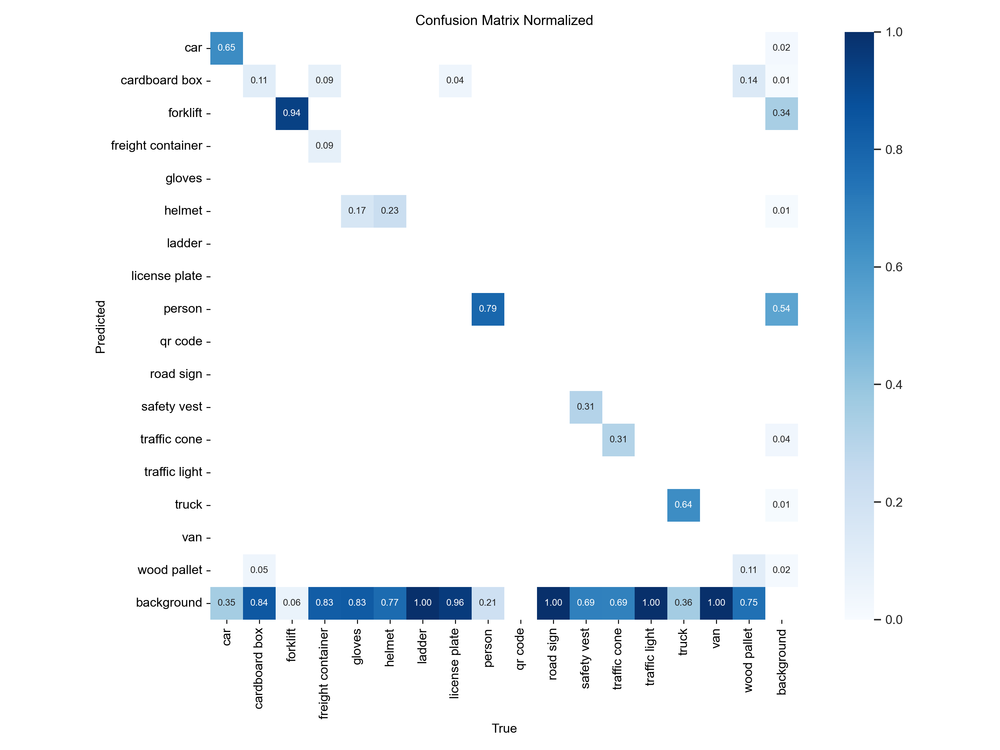


Displaying PR_curve.png:


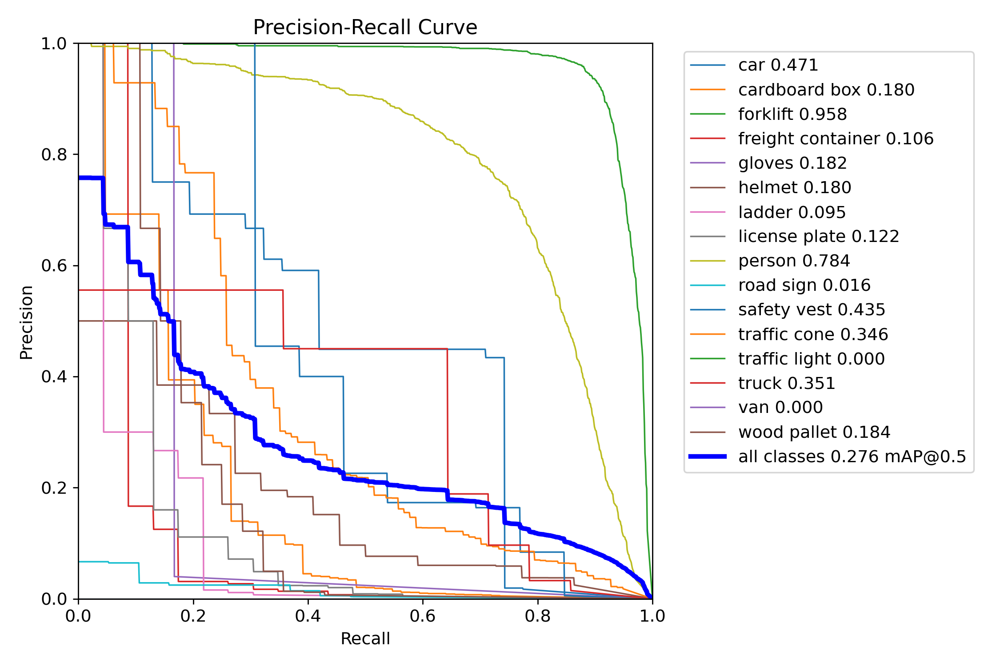


Displaying F1_curve.png:


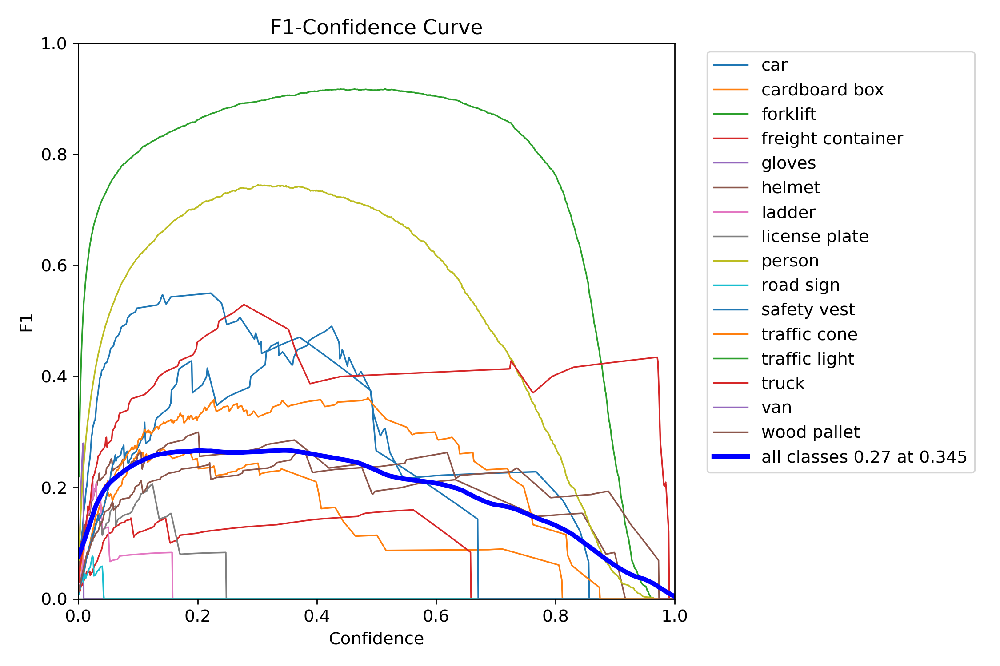

In [ ]:
# Put Here your model metrics
# TODO:
# - Run model validation on the dataset below.
# - Capture metrics and save a summary to artifacts/metrics_summary.json.
# - Optionally, add visual analysis (PR curves, confusion matrix).

from IPython.display import Image, display

print("Running validation on the test/val set...")

metrics = model.val(data=DATA_YAML_PATH, split='val', imgsz=IMGSZ, device=DEVICE, plots=True)

# Extract Per-Class Metrics
# We need to see if the minority classes are failing.
per_class_map = {}
if hasattr(metrics.box, 'maps'):
    # metrics.box.maps is an array of mAP50-95 for each class index
    for i, score in enumerate(metrics.box.maps):
        name = model.names[i]
        per_class_map[name] = round(float(score), 4)

# Build Summary Dictionary
summary = {
    "model_name": "YOLO11n",
    "global_metrics": {
        "metrics/mAP50-95(B)": float(metrics.box.map if hasattr(metrics, "box") else getattr(metrics, "map", float("nan"))),
        "metrics/mAP50(B)"   : float(getattr(metrics, "map50", float("nan"))),
        "nc": int(nc),
        "classes": class_names,
        "epochs": EPOCHS,
        "imgsz": IMGSZ,
    },
    "per_class_mAP50_95": per_class_map,
    "configuration": {
        "epochs": EPOCHS,
        "imgsz": IMGSZ,
        "batch_size": BATCH
    }
}

# Save Artifacts
os.makedirs("artifacts", exist_ok=True)
with open("artifacts/metrics_summary.json", "w") as f:
    json.dump(summary, f, indent=2)

print("Metrics saved to artifacts/metrics_summary.json")

# Visual Analysis
print("Visual Analysis:")
save_dir = metrics.save_dir

# List of useful plots YOLO generates automatically
plots_to_show = ["confusion_matrix_normalized.png", "PR_curve.png", "F1_curve.png"]

for plot_name in plots_to_show:
    plot_path = os.path.join(save_dir, plot_name)
    if os.path.exists(plot_path):
        print(f"\nDisplaying {plot_name}:")
        display(Image(filename=plot_path, width=600))
    else:
        print(f"Warning: {plot_name} not found in {save_dir}")


# Confusion Matrix Analysis
The normalized confusion matrix reveals several critical insights about the model's performance:

**High False Negative Rate**: The bottom row is dark blue for almost all minority classes (e.g., Ladder = 1.00). The model is "blind" to these classes, treating them as background noise.

**Dominant Class Hallucination**: The right-most column shows that 88% of all "ghost Detections" (false positives) are either Person (0.54) or Forklift (0.34). The model has overfit to the prior probability of these classes, therefore hallucinating them in empty space rather than risking a prediction on a minority class.

Given that classes like ladder, traffic light, and van have 0 Recall, keeping them in the dataset harms the model (distracting the optimizer) without adding value. Removing these classes from the dataset is recommended unless we can acquire more annotations for each.


# PR Curve Analysis
The PR curve give us a big picture about "Performance Tiers" of the model:

**Tier 1: Robust (Forklift, 0.958 mAP):**
The curve approaches the ideal (1, 1) corner. The model maintains >90% Precision even at high Recall. This confirms the model has fully learned the feature representation of forklifts.

**Tier 2: Degrading (Person, 0.784 mAP):**
The curve shows a distinct "knee" at Recall $\approx$ 0.6. Beyond this point, Precision drops quickly. This indicates the model struggles with "hard" examples (likely occlusion or crowds), forcing a trade-off: we can detect more people only by accepting significantly more false positives.

**Tier 3: Volatile (Cardboard Box, Safety Vest):**
The shape of these curves indicates **Data Scarcity**. The validation set contains too few samples to generate a smooth statistical curve. This suggests that the mAP scores for these classes are statistically unstable and shouldn't be used as a primary KPI without collecting more test data.

**Conclusion:**
The model is not globally "bad", it's a good **Forklift/Person detector** that guesses randomly on other classes. The PR curves for minority classes do not show learning behavior (a curve), they are show "guessing behavior" (flat lines near zero).

# F1 Curve Analysis
The F1 curve demonstrates that a only one confidence threshold isn't reliable. The model predicts 'Forklifts' with high certainty (Peak F1 > 0.8) but struggles to assign high probabilities to 'Persons' (Peak F1 @ 0.35). Implementing thresholding per class (e.g., Forklift=0.60, Person=0.35) to maximize safety for workers while minimizing noise from machinery.

### ✏️ Metrics Interpretation and Analysis

Provide a short written analysis here:

1. **Quantitative Summary:**
   - What are your `mAP50` and `mAP50-95` values?
     
      A: The model achieved a mAP50 of 0.275 and mAP50-95 of 0.182. However, these averages are misleading due to extreme variance between classes.

   - Which classes achieved the highest and lowest detection performance?
  
      A: The highest performing class is 'Forklift' with a mAP of 0.958, followed by 'Person' at 0.784. The lowest performing classes are 'Ladder', 'Traffic Light', and 'Van', all with a mAP of 0.0 due to zero recall.

2. **Qualitative Analysis:**
   - Describe common failure cases (e.g., small objects missed, overlapping detections, background confusion).

      A: The Confusion Matrix shows a 100% miss rate (background column = 1) for minority classes like ladders and signs. This confirms that the IMGSZ = 640px input resolution isn't enough to resolve features for objects that occupy <1% of the image area.

   - Were there any label quality issues or inconsistencies you observed?
   
      A: The validation set contained classes with statistically insignificant sample sizes (e.g., Van had only 2 instances). This extreme sparsity prevents the optimizer from converging and results in jagged, unstable PR curves.

3. **Improvement Proposals:**
   - Suggest at least two improvements (data augmentation, loss tuning, class balancing, etc.).
   I'd suggest the following improvements:
      - **Resolution Scaling & Pruning**: Increase input resolution to 1280px to capture small object features and prune the zero-shot classes (Van, Traffic Light) if no new data is available, as they currently only distract the loss function.
      - **Class-Balanced Sampling & Weighted Loss**: Implement oversampling for minority classes during training and apply a weighted loss function to penalize misclassifications of underrepresented classes more heavily.
      - **Data Sanitization**: Implement a "Confident Learning" loop (using tools like Cleanlab) to identify and remove training images containing "Ghost Labels" (background annotated as objects) or inconsistent annotations.
   - How would you validate whether these changes actually help?
      - After implementing the proposed changes, I would validate their effectiveness by:
         - Monitoring improvements in class-specific Recall for previously underperforming classes. A shift of this metric per class would validate that the resolution increase is effective.
         - Analyzing the confusion matrix to check for reductions in false negatives and false positives for minority classes.
         - Evaluating the stability and smoothness of PR curves for all classes to ensure that performance metrics are statistically reliable.

# 4. Inference


0: 640x640 1 forklift, 151.0ms
1: 640x640 1 forklift, 3 persons, 151.0ms
2: 640x640 1 forklift, 151.0ms
3: 640x640 1 forklift, 151.0ms
Speed: 57.7ms preprocess, 151.0ms inference, 12.5ms postprocess per image at shape (1, 3, 640, 640)


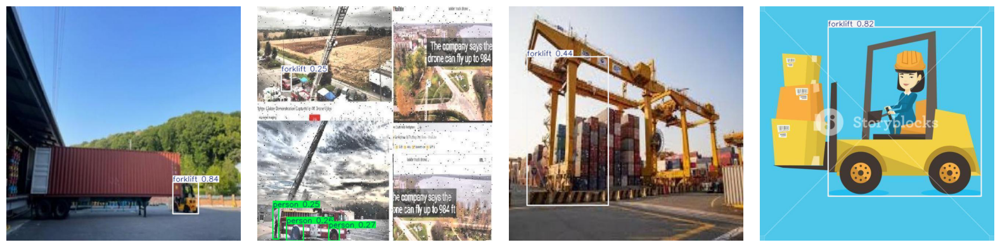

In [29]:
VAL_SHOW_N = 4
val_imgs = []
for ext in ("*.jpg", "*.jpeg", "*.png"):
    val_imgs.extend(glob.glob(os.path.join(val_dir, ext)))
val_imgs = val_imgs[:VAL_SHOW_N]

pred = model.predict(source=val_imgs, imgsz=IMGSZ, conf=0.25)
# Mostrar con matplotlib (usamos 'plot' de ultralytics para guardar)
out_dir = "runs/predict_display"
os.makedirs(out_dir, exist_ok=True)

fig, axes = plt.subplots(1, len(val_imgs), figsize=(4*len(val_imgs), 4))
if len(val_imgs) == 1:
    axes = [axes]
for ax, r in zip(axes, pred):
    im = r.plot()  # numpy array con anotaciones
    ax.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    ax.axis('off')
plt.tight_layout()
plt.show()

# 5. Export and deploy

In [ ]:

export_dir = Path("artifacts")
export_dir.mkdir(parents=True, exist_ok=True)

best_ckpt = None
for p in Path("runs/detect").rglob("weights/best.pt"):
    best_ckpt = p
    break

if best_ckpt and best_ckpt.exists():
    target = export_dir / "model_best.pt"
    target.write_bytes(best_ckpt.read_bytes())
    print("Wheight export to:", target)
else:
    print("'best.pt' not found")

with open(export_dir / "classes.json", "w") as f:
    json.dump({"nc": int(nc), "names": class_names}, f, indent=2)

try:
    _ = model.export(format="onnx", imgsz=IMGSZ)
    onnx_file = None
    for p in Path(".").rglob("*.onnx"):
        onnx_file = p
        break
    if onnx_file:
        (export_dir / "model.onnx").write_bytes(onnx_file.read_bytes())
        print("ONNX export to:", export_dir / "model.onnx")
except Exception as e:
    print("Export ONNX not available:", e)


Wheight export to: artifacts\model_best.pt
Ultralytics 8.3.228  Python-3.11.7 torch-2.2.1 CPU (11th Gen Intel Core i5-11400H @ 2.70GHz)
YOLO11n summary (fused): 100 layers, 2,585,467 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from 'runs\detect\train11\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 21, 8400) (5.2 MB)

ONNX: starting export with onnx 1.19.1 opset 17...
ONNX: slimming with onnxslim 0.1.74...


: 

# 6. TODOs (for the candidate)
- [ ] Analyze the class imbalance and propose strategies (weighting, augmented sampling, focal loss).
- [ ] Tune hyperparameters (epochs, image size, augmentations) to improve mAP.
- [ ] Record key metrics and justify the final baseline.
- [ ] Prepare all necessary artifacts in artifacts/ for the inference service (API).

# 7. Appendix — Notes on relative paths
- This notebook reads data.yaml and infers the paths to images/ and labels/ for train/, val/, and test/.
- If you move data.yaml to another folder, adjust DATA_YAML_PATH.
- If the dataset was downloaded from Roboflow, keep the standard YOLO folder structure.